Soal 5: Music Analysis dan Remix

Audio sedih: 60.19 detik | Sample Rate: 44100
Audio ceria: 60.91 detik | Sample Rate: 44100


C:\Users\Elma\AppData\Local\Temp\ipykernel_7396\2413897524.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tempo_sedih = float(tempo_sedih)
C:\Users\Elma\AppData\Local\Temp\ipykernel_7396\2413897524.py:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tempo_ceria = float(tempo_ceria)



=== HASIL ANALISIS AUDIO ===
Lagu Sedih : 161.5 BPM | Perkiraan Nada Dasar: G
Lagu Ceria : 90.7 BPM | Perkiraan Nada Dasar: G#


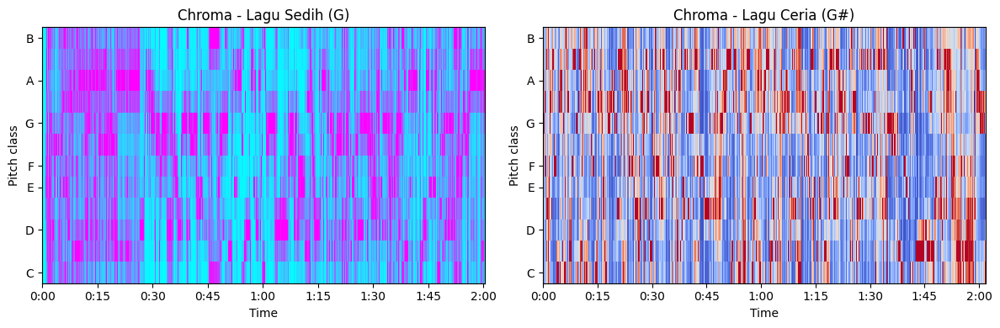

In [2]:
import librosa
import numpy as np
import librosa.display
import matplotlib.pyplot as plt

# 1. Load Audio
path_sedih = "../Data/sedih.wav"
path_ceria = "../Data/ceria.wav"

y_sedih, sr_sedih = librosa.load(path_sedih, sr=None)
y_ceria, sr_ceria = librosa.load(path_ceria, sr=None)

print(f"Audio sedih: {len(y_sedih)/sr_sedih:.2f} detik | Sample Rate: {sr_sedih}")
print(f"Audio ceria: {len(y_ceria)/sr_ceria:.2f} detik | Sample Rate: {sr_ceria}")

# 2. Deteksi Tempo (BPM)
tempo_sedih, _ = librosa.beat.beat_track(y=y_sedih, sr=sr_sedih)
tempo_ceria, _ = librosa.beat.beat_track(y=y_ceria, sr=sr_ceria)

# pastikan hasil berupa float
tempo_sedih = float(tempo_sedih)
tempo_ceria = float(tempo_ceria)

# 3. Estimasi Key / Nada Dasar
chroma_sedih = librosa.feature.chroma_stft(y=y_sedih, sr=sr_sedih)
chroma_ceria = librosa.feature.chroma_stft(y=y_ceria, sr=sr_ceria)

notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']

key_sedih = notes[int(np.argmax(np.mean(chroma_sedih, axis=1)))]
key_ceria = notes[int(np.argmax(np.mean(chroma_ceria, axis=1)))]

# 4. Tampilkan Hasil
print("\n=== HASIL ANALISIS AUDIO ===")
print(f"Lagu Sedih : {tempo_sedih:.1f} BPM | Perkiraan Nada Dasar: {key_sedih}")
print(f"Lagu Ceria : {tempo_ceria:.1f} BPM | Perkiraan Nada Dasar: {key_ceria}")


# 6. Visualisasi
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
librosa.display.specshow(chroma_sedih, x_axis='time', y_axis='chroma', cmap='cool')
plt.title(f"Chroma - Lagu Sedih ({key_sedih})")

plt.subplot(1, 2, 2)
librosa.display.specshow(chroma_ceria, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.title(f"Chroma - Lagu Ceria ({key_ceria})")

plt.tight_layout()
plt.show()


C:\Users\Elma\AppData\Local\Temp\ipykernel_7396\4213629070.py:20: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  tempo_sedih, tempo_ceria = float(tempo_sedih), float(tempo_ceria)


=== INFO AWAL ===
Lagu Sedih : 161.5 BPM | Key: G
Lagu Ceria : 90.7 BPM | Key: G#

Tempo disamakan ke sekitar 126.1 BPM
Pitch lagu sedih digeser +1 semitone → disamakan ke G#

✅ Remix selesai dan disimpan sebagai 'Remix_Final.wav'


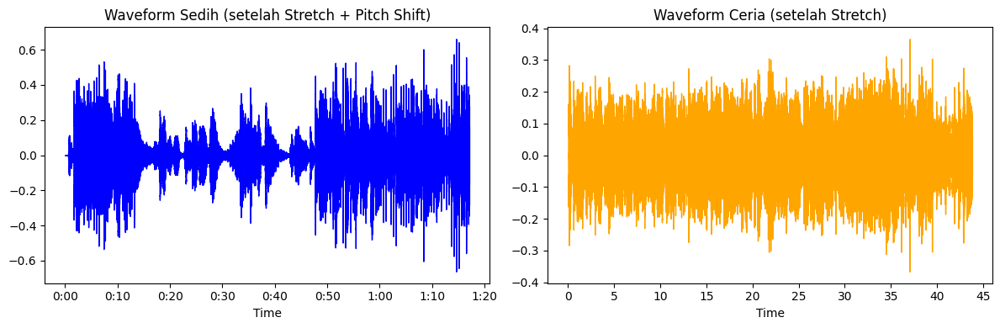

In [4]:
import librosa
import librosa.display
import numpy as np
from pydub import AudioSegment
import matplotlib.pyplot as plt
import soundfile as sf
from IPython.display import Audio


# 1. Load Audio
path_sedih = "../Data/sedih.wav"
path_ceria = "../Data/ceria.wav"

y_sedih, sr_sedih = librosa.load(path_sedih, sr=None)
y_ceria, sr_ceria = librosa.load(path_ceria, sr=None)

# 2. Deteksi Tempo (BPM)
tempo_sedih, _ = librosa.beat.beat_track(y=y_sedih, sr=sr_sedih)
tempo_ceria, _ = librosa.beat.beat_track(y=y_ceria, sr=sr_ceria)
tempo_sedih, tempo_ceria = float(tempo_sedih), float(tempo_ceria)

# 3. Estimasi Nada Dasar (Key)
chroma_sedih = librosa.feature.chroma_stft(y=y_sedih, sr=sr_sedih)
chroma_ceria = librosa.feature.chroma_stft(y=y_ceria, sr=sr_ceria)
notes = ['C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'A', 'A#', 'B']
key_sedih = notes[int(np.argmax(np.mean(chroma_sedih, axis=1)))]
key_ceria = notes[int(np.argmax(np.mean(chroma_ceria, axis=1)))]

print("=== INFO AWAL ===")
print(f"Lagu Sedih : {tempo_sedih:.1f} BPM | Key: {key_sedih}")
print(f"Lagu Ceria : {tempo_ceria:.1f} BPM | Key: {key_ceria}")

# 4. Time Stretch (Samakan Tempo)
target_bpm = np.mean([tempo_sedih, tempo_ceria])
rate_sedih = target_bpm / tempo_sedih
rate_ceria = target_bpm / tempo_ceria

def stretch_audio(y, rate):
    D = librosa.stft(y)
    D_stretch = librosa.phase_vocoder(D, rate=rate)
    return librosa.istft(D_stretch)

y_sedih_stretch = stretch_audio(y_sedih, rate_sedih)
y_ceria_stretch = stretch_audio(y_ceria, rate_ceria)

print(f"\nTempo disamakan ke sekitar {target_bpm:.1f} BPM")

# 5. Pitch Shift (Samakan Key)
idx_sedih = notes.index(key_sedih)
idx_ceria = notes.index(key_ceria)
shift_steps = idx_ceria - idx_sedih

y_sedih_pitch = librosa.effects.pitch_shift(y=y_sedih_stretch, sr=sr_sedih, n_steps=shift_steps)

print(f"Pitch lagu sedih digeser {shift_steps:+} semitone → disamakan ke {key_ceria}")

# 6. Simpan hasil sementara
sf.write("sedih_sync.wav", y_sedih_pitch, sr_sedih)
sf.write("ceria_sync.wav", y_ceria_stretch, sr_ceria)

# 7. Crossfade Remix
audio_sedih = AudioSegment.from_file("sedih_sync.wav")
audio_ceria = AudioSegment.from_file("ceria_sync.wav")

min_len = min(len(audio_sedih), len(audio_ceria))
audio_sedih = audio_sedih[:min_len]
audio_ceria = audio_ceria[:min_len]

crossfade_ms = 5000  # 5 detik
remix = audio_sedih.append(audio_ceria, crossfade=crossfade_ms)

# 8. Filter Tambahan
remix = remix.low_pass_filter(9000)
remix = remix.fade_in(2000).fade_out(2000)

# 9. Simpan hasil remix
remix.export("Remix_Final.wav", format="wav")
print("\n✅ Remix selesai dan disimpan sebagai 'Remix_Final.wav'")

# 10. Visualisasi Waveform
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
librosa.display.waveshow(y_sedih_pitch, sr=sr_sedih, color='b')
plt.title("Waveform Sedih (setelah Stretch + Pitch Shift)")
plt.subplot(1, 2, 2)
librosa.display.waveshow(y_ceria_stretch, sr=sr_ceria, color='orange')
plt.title("Waveform Ceria (setelah Stretch)")
plt.tight_layout()
plt.show()

Audio("Remix_Final.wav")

1. proses dan parameter yang digunakan pada saat menganalisis karakter musik dasar dari dua lagu sedih dan ceria digunakan untuk mengetahui tempo(BPM) dan nada dasar(key). pertama menggunakan librosa.load() untuk membaca file audio. kemudian librosa.beat.beat_track() untuk mendeteksi kecepatan iramanya dalam satuan BPM. kemudian fitur chroma digunakan untuk mendeteksi ndad dominan dari lagu (intensitas energi nada musik). kemudian librosa.display.specshow() untuk memvisualisasikan BPM dan nada dasar tiap lagu dalam bentuk chroma plot. kemudian untuk remix lagu langkah awal sama menampilkan audio kemudian melakukan time strech dengan fungsi strech_audio() untuk menyamakan tempo menggunakan target_bpm dimana ini digunakan untuk mencari rata-rata dari kedua tempo lagu, kemudian dihitung rasio kecepatannya (rate) untuk menyesuaikan durasi. kemudian pitch_shift() untuk menggeser nada dasar lagu sedih agar sama dengan lagu ceria. kemudian untuk menggabungkan audionya menggunakan pydub. dan menambahkan filter low pass untuk menghasilkan suara yang lebih lembut, fadein dan fade out untuk membuat musik perlahan di awal dan di akhir.

Durasi Remix : 82.61 detik | Sample Rate: 44100


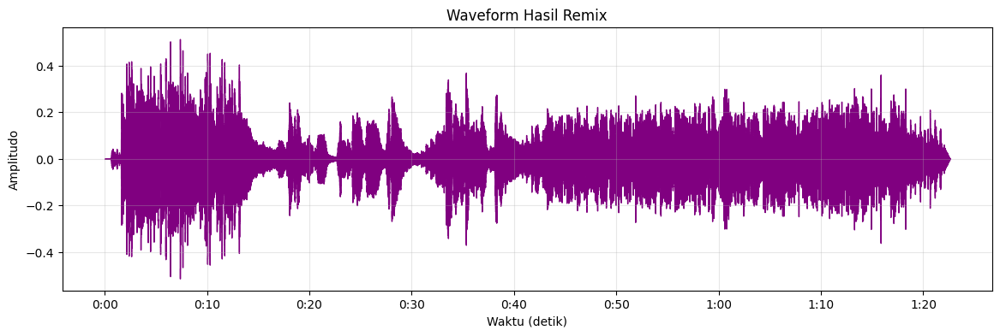

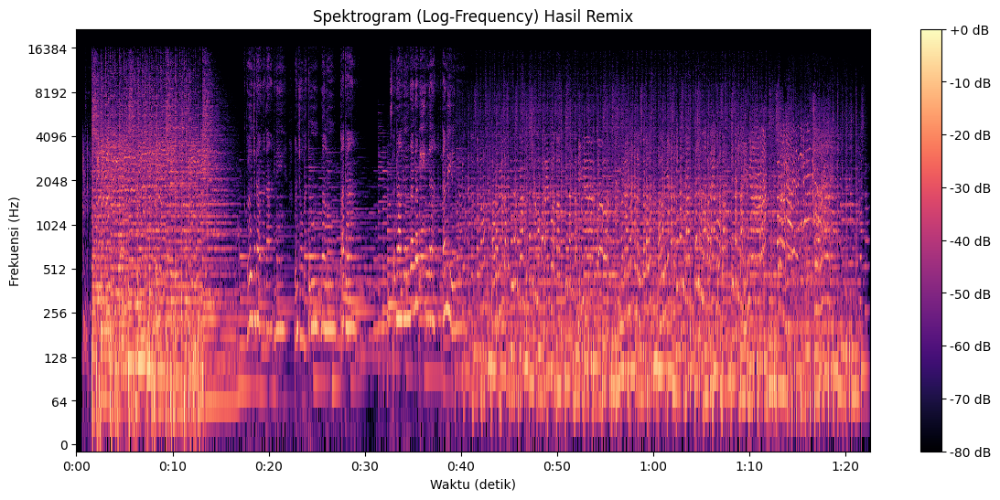

In [5]:
# === 1. Load hasil remix ===
remix_path = "Remix_Final.wav"
y_remix, sr_remix = librosa.load(remix_path, sr=None)

print(f"Durasi Remix : {len(y_remix)/sr_remix:.2f} detik | Sample Rate: {sr_remix}")

# === 2. Visualisasi Waveform ===
plt.figure(figsize=(14, 4))
librosa.display.waveshow(y_remix, sr=sr_remix, color='purple')
plt.title("Waveform Hasil Remix")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.grid(alpha=0.3)
plt.show()

# === 3. Visualisasi Spektrogram ===
plt.figure(figsize=(14, 6))

# Konversi ke spektrogram dB
S = librosa.stft(y_remix)
S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)

librosa.display.specshow(S_db, sr=sr_remix, x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format="%+2.0f dB")
plt.title("Spektrogram (Log-Frequency) Hasil Remix")
plt.xlabel("Waktu (detik)")
plt.ylabel("Frekuensi (Hz)")
plt.show()


Hasil dari remix kedua audio sedih dan ceria telah berhasil di gabungkan. tempo dan nada dasarnya telah disamakan, dan transisi antar lagu mulus tidak terlalu jomplang dengan menggunakan efek crossfading. secara visual dari wavefrom dan spectogram tidak ada lonjakan energi yang ekstrim, sehingga hasil remix dari kedua lagu ini cukup stabil